# PUBLICATION
## Long-Range Redox and Water Activation at Metal-Water Interfaces with Ferroelectric Ordering

Arthur Hagopian <sup>1</sup>, Jean-Sébastien Filhol <sup>2</sup>, Tobias Binninger <sup>3</sup>  
<sup>1</sup> Leiden Institute of Chemistry, Leiden University, Leiden 2333CC, the Netherlands  
<sup>2</sup> ICGM, CNRS, University of Montpellier, Montpellier, France  
<sup>3</sup> Theory and Computation of Energy Materials (IET-3), Institute of Energy Technologies, Forschungszentrum Jülich GmbH, 52425 Jülich, Germany  

[GitHub Repository](https://github.com/arthur-hagopian/PUBLICATION_2025_Ferroelectric_Ice)

---

This notebook analyzes Density Functional Theory (DFT) results for free-standing and Au(111)-supported ferroelectric ice slabs.  
Key data (e.g., DOS, Bader charges) are extracted from VASP output files and visualized.  

In [1]:
# Standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import re
import plotly.graph_objects as go
from pathlib import Path

# Personal library - Contains all the functions for this notebook
try:
    import myfunctions as mf
except ImportError:
    print("Could not import 'myfunctions.py'. Make sure it exists in the same folder as this notebook.")

# Configure logger
mf.configure_logger()

In [2]:
# General path to the data
data_directory = "../data/"

# List available systems
systems = sorted([
    item for item in os.listdir(data_directory)
    if os.path.isdir(os.path.join(data_directory, item))
    and item.startswith("ice")
])

print("Available systems:", systems)

Available systems: ['ice_free_standing', 'ice_supported_Au_111']


In [3]:
# Upload data
data = mf.load_all_data(data_directory)

print("📊 Data overview:\n")
for key, subdict in data.items():
    subdict_type = type(subdict).__name__
    size = len(subdict)
    print(f"- {key:<12} | type: {subdict_type:<10} | len: {size:<3}")

📊 Data overview:

- H_positions  | type: dict       | len: 99 
- O_positions  | type: dict       | len: 99 
- Au_positions | type: dict       | len: 99 
- pdos         | type: dict       | len: 100
- bader        | type: dict       | len: 34 


In [4]:
# Visualize cells
path = Path("../data/ice_supported_Au_111/01_relaxed/Hdown_5/CONTCAR") # Choose the system to visuliaze

H_frac = data['H_positions'][path]
O_frac = data['O_positions'][path]
Au_frac = data['Au_positions'].get(path)  # may be None

cell = np.array([
    [14.6976995468,  0.0, 0.0],
    [-7.3488497734, 12.7285811847, 0.0],
    [ 0.0, 0.0, 49.2004013062]
])

# Convert fractional to Cartesian
H_cart = H_frac @ cell
O_cart = O_frac @ cell
Au_cart = Au_frac @ cell if Au_frac is not None else None

mf.plotly_3d_atoms(H_cart, O_cart, Au_cart, cell=cell, projection='orthographic')

path = Path("../data/ice_supported_Au_111/01_relaxed/Hup_5/CONTCAR") # Choose the system to visuliaze
print(path)

H_frac = data['H_positions'][path]
O_frac = data['O_positions'][path]
Au_frac = data['Au_positions'].get(path)  # may be None

cell = np.array([
    [14.6976995468,  0.0, 0.0],
    [-7.3488497734, 12.7285811847, 0.0],
    [ 0.0, 0.0, 49.2004013062]
])

# Convert fractional to Cartesian
H_cart = H_frac @ cell
O_cart = O_frac @ cell
Au_cart = Au_frac @ cell if Au_frac is not None else None

mf.plotly_3d_atoms(H_cart, O_cart, Au_cart, cell=cell, projection='orthographic')

../data/ice_supported_Au_111/01_relaxed/Hup_5/CONTCAR


## 1. Free-standing ice slabs

### PDOS

#### Frozen systems

--- bilayer_1 ---


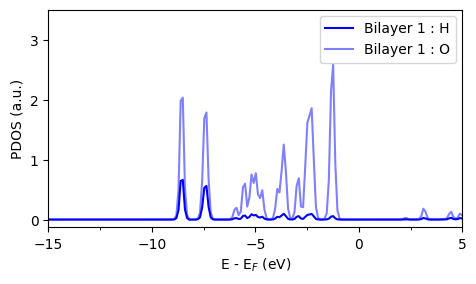

--- bilayer_2 ---


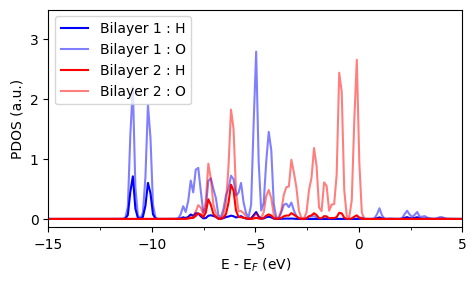

--- bilayer_3 ---


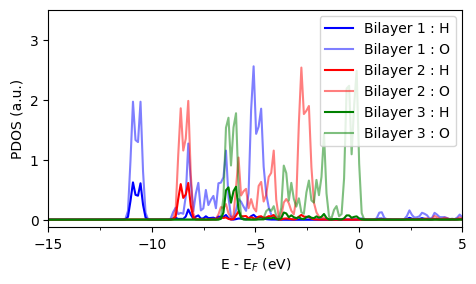

--- bilayer_4 ---


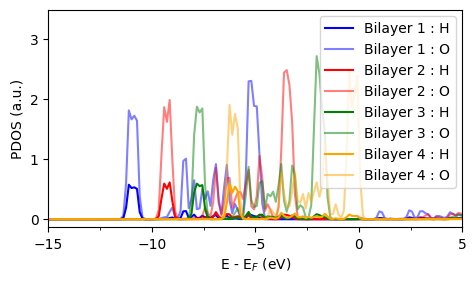

--- bilayer_5 ---


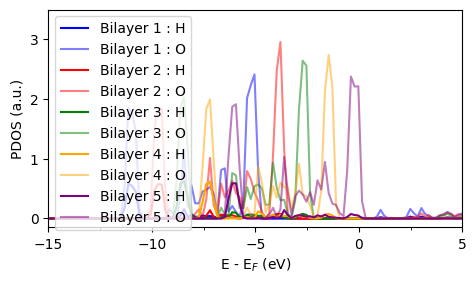

--- bilayer_6 ---


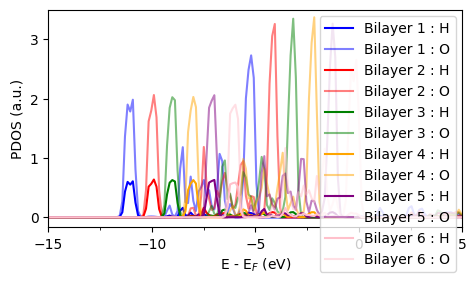

In [5]:
mf.plot_pdos_all_bilayers(
    data,
    base_path="../data/ice_free_standing/00_frozen",
    folder_label="bilayer",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

#### Relaxed systems

--- bilayer_1 ---


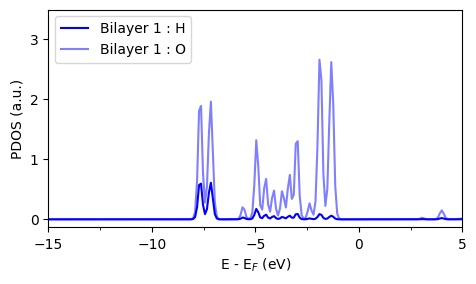

--- bilayer_2 ---


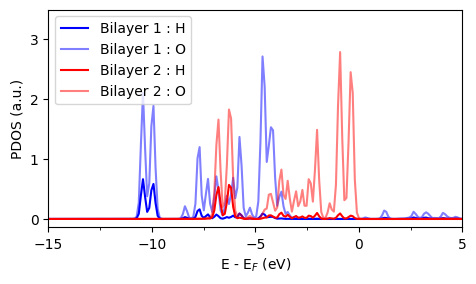

--- bilayer_3 ---


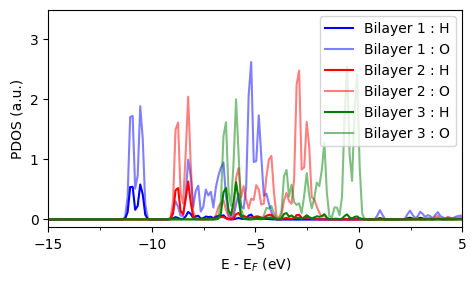

--- bilayer_4 ---


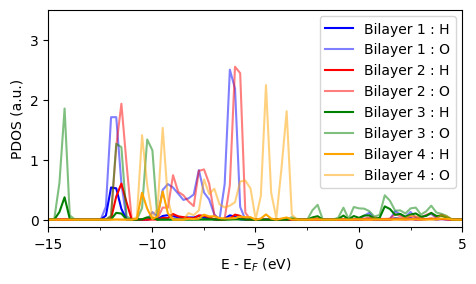

--- bilayer_5 ---


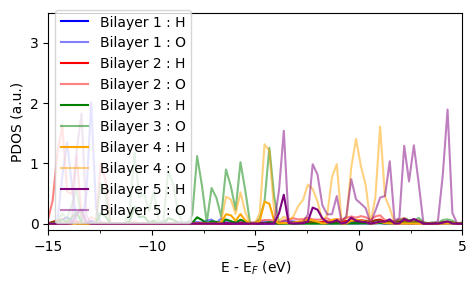

--- bilayer_6 ---


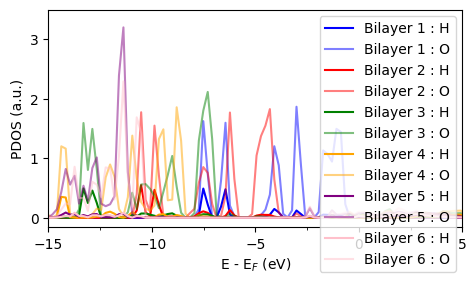

In [6]:
mf.plot_pdos_all_bilayers(
    data,
    base_path="ice_free_standing/01_relaxed",
    folder_label="bilayer",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

### Bader charge

#### Frozen systems

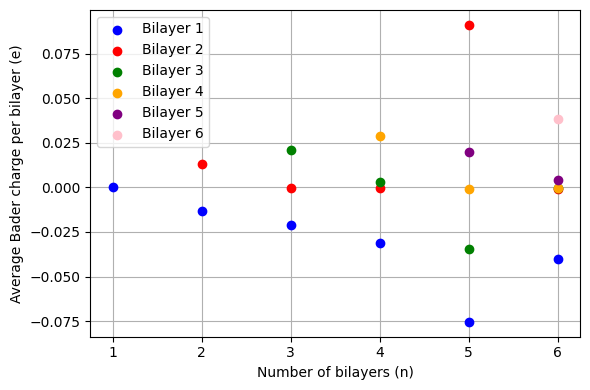

In [7]:
mf.plot_bilayer_avg_charge(
    data,
    base_path="ice_free_standing/00_frozen",
    folder_label="bilayer",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

#### Relaxed systems

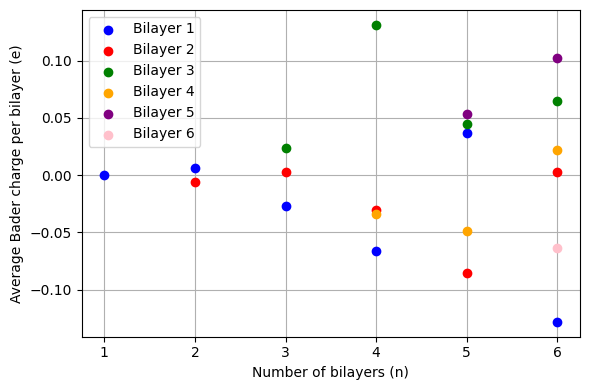

In [8]:
mf.plot_bilayer_avg_charge(
    data,
    base_path="ice_free_standing/01_relaxed",
    folder_label="bilayer",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

### Interbilayer distance

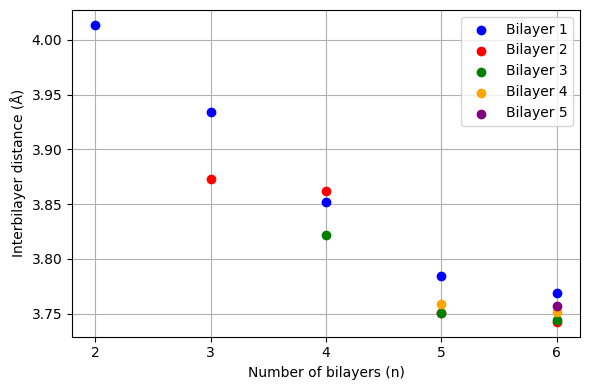

In [9]:
mf.plot_interbilayer_distance(
    data,
    base_path="ice_free_standing/01_relaxed",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    lz=49.2004013061999999,
    max_layers=6
)

## 2. Au(111)-supported ice slabs

### PDOS

#### Frozen systems - Hdown

--- bilayer_1 ---


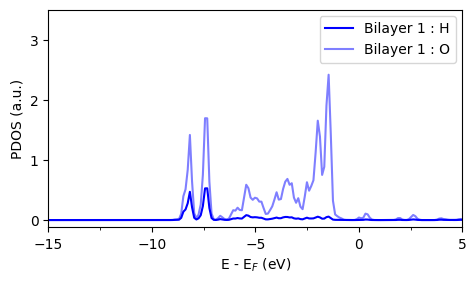

--- bilayer_2 ---


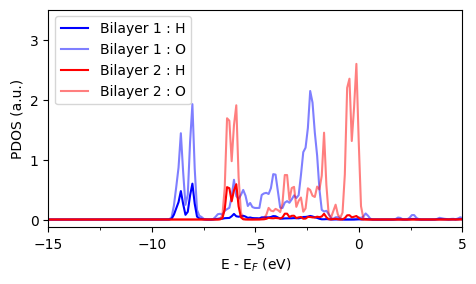

--- bilayer_3 ---


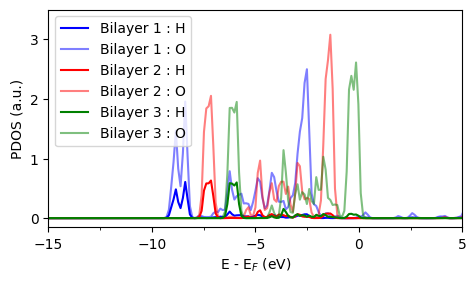

--- bilayer_4 ---


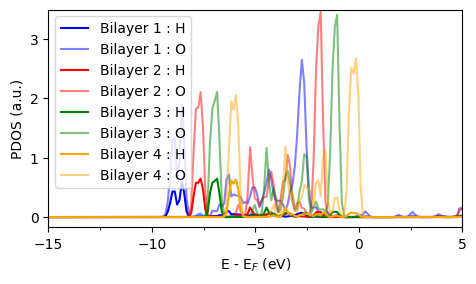

--- bilayer_5 ---


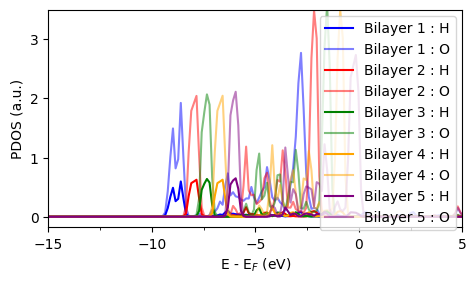

--- bilayer_6 ---


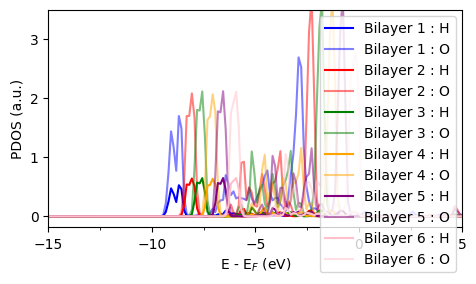

In [10]:
mf.plot_pdos_all_bilayers(
    data,
    base_path="ice_supported_Au_111/00_frozen",
    folder_label="Hdown",
    z_bounds=[0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

#### Frozen systems - Hup

--- bilayer_1 ---


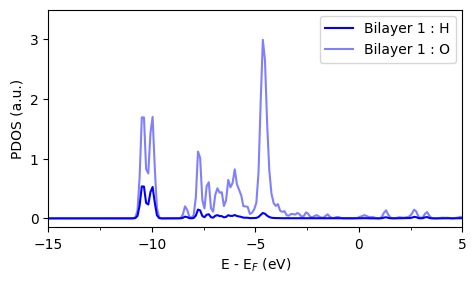

--- bilayer_2 ---


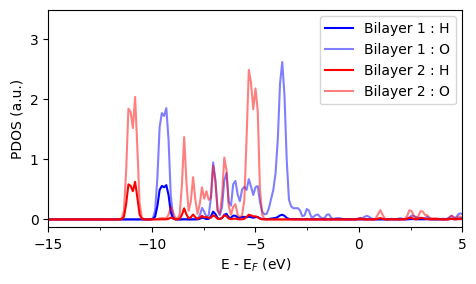

--- bilayer_3 ---


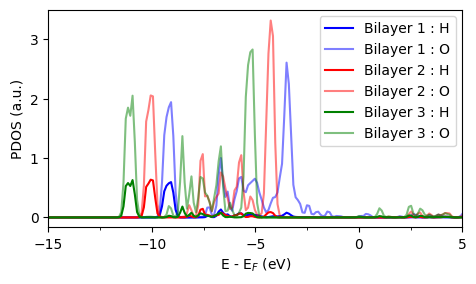

--- bilayer_4 ---


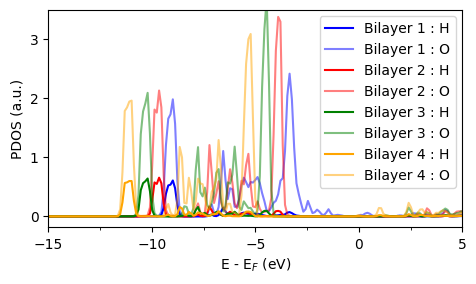

--- bilayer_5 ---


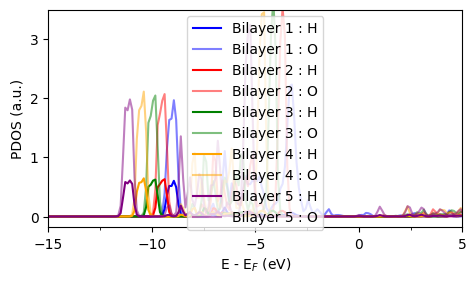

--- bilayer_6 ---


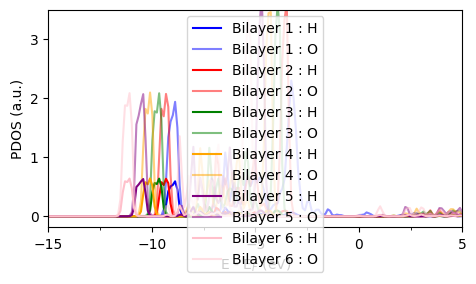

In [11]:
mf.plot_pdos_all_bilayers(
    data,
    base_path="ice_supported_Au_111/00_frozen",
    folder_label="Hup",
    z_bounds=[0.00, 0.26, 0.34, 0.42, 0.50, 0.58, 1.00],
    max_layers=6
)

### Bader charge

#### Relaxed systems - Hdown

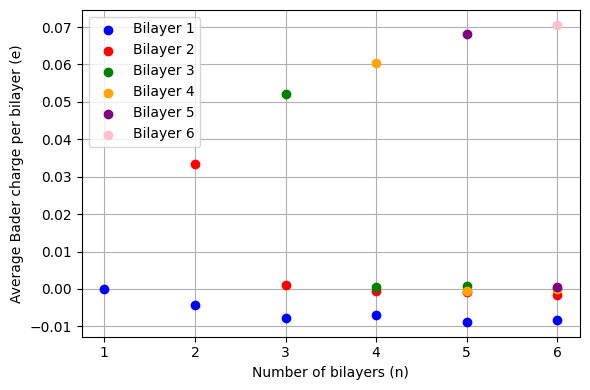

In [12]:
mf.plot_bilayer_avg_charge(
    data,
    base_path="ice_supported_Au_111/01_relaxed",
    folder_label="Hdown",
    z_bounds = [0.00, 0.24, 0.32, 0.40, 0.48, 0.56, 1.00],
    max_layers=6
)

#### Relaxed systems - Hup

No Bader data for bilayer_6, skipping


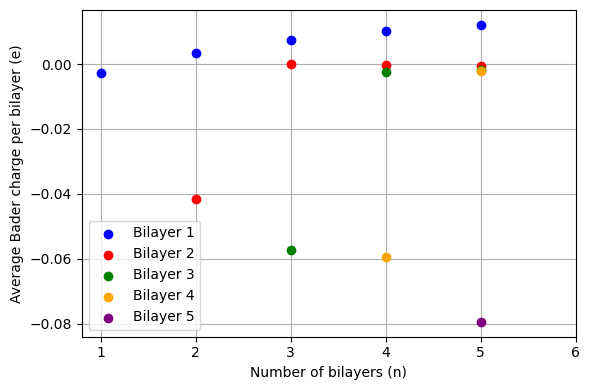

In [13]:
mf.plot_bilayer_avg_charge(
    data,
    base_path="ice_supported_Au_111/01_relaxed",
    folder_label="Hup",
    z_bounds = [0.00, 0.26, 0.34, 0.42, 0.50, 0.58, 1.00],
    max_layers=6
)

### Work function

### Vertical dipole

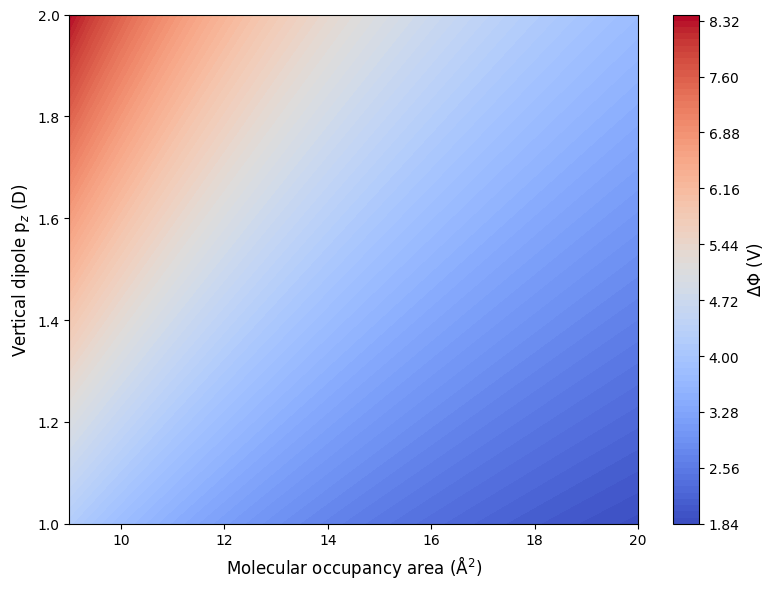

In [14]:
# Define the range for area A and dipole p
A = np.linspace(9, 20, 200)  # Area values in Å^2
p = np.linspace(1.0, 2.0, 200)  # Dipole values in Debye

# Create a meshgrid for A and p
A_grid, p_grid = np.meshgrid(A, p)

# Physical constants
debye_to_Cm = 3.33564e-30  # 1 Debye in C·m
angstrom2_to_m2 = 1e-20    # 1 Å^2 in m^2
epsilon_0 = 8.854e-12      # Vacuum permittivity in F/m

# Calculate the potential drop Delta Phi
delta_phi = (p_grid * debye_to_Cm) / (A_grid * angstrom2_to_m2 * epsilon_0)

# Plotting
plt.figure(figsize=(8, 6))
contour = plt.contourf(A_grid, p_grid, delta_phi, levels=100, cmap='coolwarm')
cbar = plt.colorbar(contour)
cbar.set_label(r'$\Delta \Phi$ (V)', fontsize=12)

plt.xlabel('Molecular occupancy area (Å$^2$)', fontsize=12)
plt.ylabel('Vertical dipole p$_z$ (D)', fontsize=12)
plt.tight_layout()
plt.show()